# **Lab 2.1 Image Enhancement with Math Operation**
This lab consists of two main subparts: Image Pixel Adjustment using Linear Equations and Gamma Equations.

In [45]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1 import ImageGrid
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

Read an image using OpenCV (Use your own image).

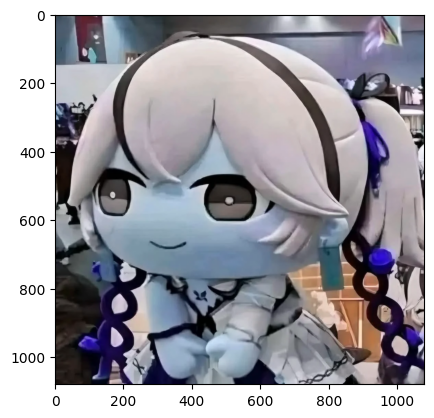

In [46]:
### START CODE HERE ###
img = cv2.imread("assets/Camellya.webp")


plt.imshow(img)
### END CODE HERE ###

## **Image Pixel Adjustment**

### Using Linear Equation
$$I_{new} = I \cdot a + b$$

Please perform at ***least 20 iterations*** with varying values of $a$ and $b$.
Assign the result of each iteration to an array.<br/>

In [47]:
### START CODE HERE ###
a = 0
b = 0

lin_result = []

a_values = np.linspace(1, 5, 20)  
b_values = np.linspace(-50, 50, 20) 

# for a in a_values:
#     for b in b_values:
#         result = img * a + b
#         result = np.clip(result, 0, 255).astype(np.uint8)
#         lin_result.append(result)
#         print(f"a : {a} b : {b}" )
#         if len(lin_result) >= 20:
#             break
#     if len(lin_result) >= 20:
#         break

ex = []
for a, b in zip(a_values, b_values):
    result = img * a + b
    result = np.clip(result, 0, 255).astype(np.uint8)
    lin_result.append(result)
    print(f"a : {a} b : {b}" )
    if len(lin_result) >= 20:
        break


### END CODE HERE ###

a : 1.0 b : -50.0
a : 1.2105263157894737 b : -44.73684210526316
a : 1.4210526315789473 b : -39.473684210526315
a : 1.631578947368421 b : -34.21052631578947
a : 1.8421052631578947 b : -28.94736842105263
a : 2.052631578947368 b : -23.684210526315788
a : 2.263157894736842 b : -18.421052631578945
a : 2.473684210526316 b : -13.157894736842103
a : 2.6842105263157894 b : -7.89473684210526
a : 2.894736842105263 b : -2.6315789473684177
a : 3.1052631578947367 b : 2.631578947368425
a : 3.3157894736842106 b : 7.894736842105267
a : 3.526315789473684 b : 13.15789473684211
a : 3.7368421052631575 b : 18.42105263157896
a : 3.9473684210526314 b : 23.684210526315795
a : 4.157894736842105 b : 28.94736842105263
a : 4.368421052631579 b : 34.21052631578948
a : 4.578947368421052 b : 39.47368421052633
a : 4.789473684210526 b : 44.736842105263165
a : 5.0 b : 50.0


Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical
- The reference output used 40 iterations.

![image-2.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/1-1.png?raw=true)
</details>


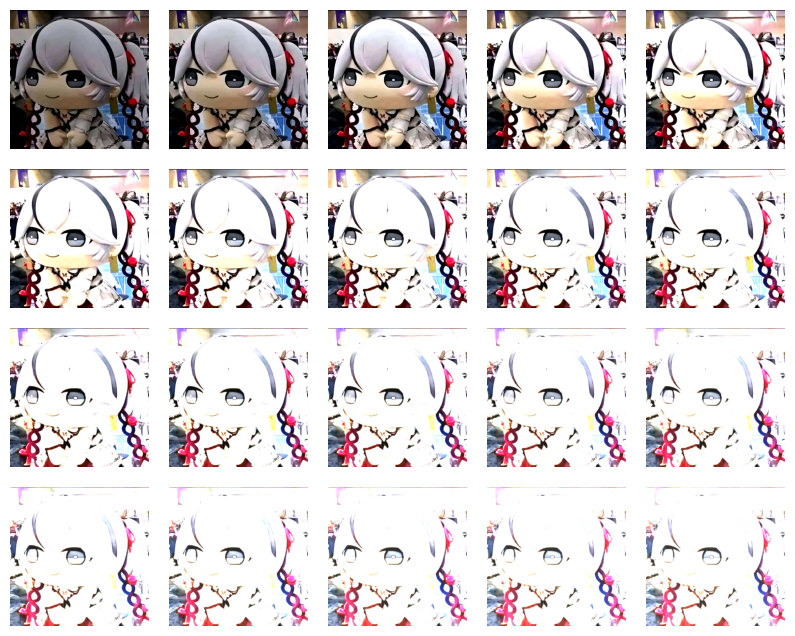

In [48]:
### START CODE HERE ###
fig = plt.figure(figsize=(12, 8))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 5), axes_pad=0.2)

for ax, img_out in zip(grid, lin_result[:20]):
    ax.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
    ax.axis('off')


plt.show()
### END CODE HERE ###

If you code work properly, the cell below should run without error.

In [49]:
assert len(lin_result) >= 20, f"Expected more than or equal 20 iterations but got {len(lin_result)}"
for idx, result in enumerate(lin_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Save the array of images to a video. Please complete the function below.

In [50]:
### START CODE HERE ###

### END CODE HERE ###
def write_images_to_video(image_array, output_file, frame_rate=30):
    height, width = image_array[0].shape[:2]
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_file, fourcc, frame_rate, (width, height))

    for img in image_array:
        if img.shape[2] == 3:
            out.write(img)
        else:
            out.write(cv2.cvtColor(img, cv2.COLOR_GRAY2BGR))
    out.release()

Use `write_images_to_video()` and save the result.

In [51]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_linear.mp4")
write_images_to_video(lin_result,output_file)

Now use `matplotlib.animation` to display the animation from the images array.

In [52]:
%%capture
### START CODE HERE ###
fig, ax = plt.subplots()
frames = [[ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), animated=True)] for img in lin_result]
ani = animation.ArtistAnimation(fig, frames, interval=100, blit=True, repeat_delay=500)

### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![linear.gif](![<attachment:linear (2).gif>](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/linear.gif?raw=true))

</details>

In [53]:
display(HTML(ani.to_jshtml()))

### Gamma Equation
$$I_{new} = I^{\gamma} \cdot a + b$$

Where $a$ is 1 and $b$ is 0. 
Please perform ***at least 10 iterations*** for 0 < $\gamma$ < 1 and another ***at least 10 iterations*** for $\gamma$ > 1
Assign the result of each iteration to an array.<br/>


In [54]:
### START CODE HERE ###
a = 1
b = 0
gamma = 0.1

gam_result = []
gam_value = []

gamma_values1 = np.linspace(0.5, 1.5, 20)   
img = cv2.imread("assets/Camellya.webp")
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# gamma_values2 = np.linspace(1.0, 2, 10)   

img = (img - img.min()) / (img.max() - img.min())  # Normalize the image to [0, 1]

# for gamma in gamma_values1:
#     result = (img ** gamma) * a + b
#     result = np.clip(result, 0, 255).astype(np.uint8)
#     gam_result.append(result)
#     gam_value.append(gamma)
#     print(gamma)
#     if gamma >= 1:
#         break

for gamma in gamma_values1:
    result = ((img ** gamma) * a) + b
    result = (result * 255).astype(np.uint8)
    gam_result.append(result)
    gam_value.append(gamma)
    print(gamma)
    if len(gam_result) >= 20:
        break

### END CODE HERE ###
# a = 0
# b = 0

# lin_result = []

# a_values = np.linspace(1, 5, 10)  
# b_values = np.linspace(-50, 50, 10) 

# # Iterate over all combinations (at least 20 iterations)
# for a in a_values:
#     for b in b_values:
#         result = img * a + b
#         result = np.clip(result, 0, 255).astype(np.uint8)
#         lin_result.append(result)
#         if len(lin_result) >= 20:
#             break
#     if len(lin_result) >= 20:
#         break

0.5
0.5526315789473684
0.6052631578947368
0.6578947368421053
0.7105263157894737
0.763157894736842
0.8157894736842105
0.868421052631579
0.9210526315789473
0.9736842105263157
1.026315789473684
1.0789473684210527
1.131578947368421
1.1842105263157894
1.236842105263158
1.2894736842105263
1.3421052631578947
1.394736842105263
1.4473684210526314
1.5


Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image-2.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/1-2.png?raw=true)
</details>

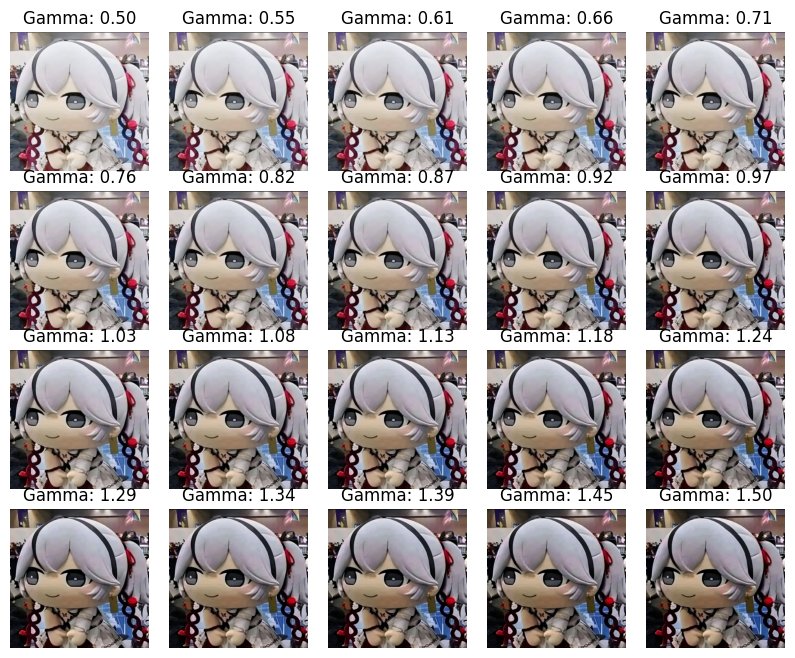

In [55]:
### START CODE HERE ###

fig = plt.figure(figsize=(12, 8))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 5), axes_pad=0.2)

for ax, img_out, gam in zip(grid, gam_result[:20], gam_value[:20]):
    ax.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
    ax.title.set_text(f'Gamma: {gam:.2f}')
    ax.axis('off')


plt.show()
### END CODE HERE ###

In [56]:
assert len(gam_result) >= 20, f"more than or equal 20 iterations but got {len(gam_result)}"
for idx, result in enumerate(gam_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Use `write_images_to_video()` and save the result.

In [57]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_gamma.mp4")
write_images_to_video(gam_result,output_file)

Now use `matplotlib.animation` to display the animation from the images array.

In [58]:
%%capture
### START CODE HERE ###
fig, ax = plt.subplots()
frames = [[ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), animated=True)] for img in gam_result]
ani = animation.ArtistAnimation(fig, frames, interval=100, blit=True, repeat_delay=500)
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![gamma2.gif](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/gamma.gif?raw=true)

</details>

In [59]:
display(HTML(ani.to_jshtml()))

---

## **Questions**
1. If an image having over brightness or saturation, what would be possible solutions to enhance the image.
2. How can we make an image reverse intensity (black-to-white, white-to-black)? Explain the process

## **Answer**
1.เราสามารถใช้ Gamma Correction Histogram เพื่อปรับค่าความสว่างที่เกินมาหรือขาดหายไปได้

2.เราสามารถกลับความเข้มของสีภาพได้โดยการนำค่าสีที่สูงสุดที่เป็นไปได้มาลบค่าสี pixel ที่จุดนั้น  => Xinv = Xmax - X  ;X คือค่าสี